In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import numpy as np
from numpy import expand_dims
from mrcnn.config import Config
from mrcnn.model import MaskRCNN
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import cv2
from mrcnn.model import mold_image
from PIL import Image, ImageEnhance, ImageFilter
import pytesseract
from Utility.ImageProcessing import *
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import tensorflow as tf
from openalpr import Alpr
import pickle
import io
import time
import re
from google.cloud import vision
import re
from difflib import SequenceMatcher
import tesserocr
from tesserocr import PyTessBaseAPI
# Change path to your own tesseract installation.
# Tesseract installation: https://github.com/tesseract-ocr/tesseract
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

ModuleNotFoundError: No module named 'tensorflow'

# Model Inladen

In [4]:
# define the prediction configuration
class PredictionConfig(Config):
    # define the name of the configuration
    NAME = "plate_cfg"
    # number of classes (background + kangaroo)
    NUM_CLASSES = 1 + 1
    # simplify GPU config
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    GENERATE_MASKS = False

In [72]:
# create config
cfg = PredictionConfig()
# define the model
#model_vers1 = MaskRCNN(mode='inference', model_dir='./', config=cfg)
#model_vers2 = MaskRCNN(mode='inference', model_dir='./', config=cfg)
model_vers3 = MaskRCNN(mode='inference', model_dir='./', config=cfg)
# load model weights
#model_vers1.load_weights('mask_rcnn_plate_cfg_0100.h5', by_name=True)
#model_vers2.load_weights('mask_rcnn_plate_cfg_0030.h5', by_name=True)
model_vers3.load_weights('mask_rcnn_plate_cfg_vers2_00100.h5', by_name=True)

# Kenteken Detectie

In [7]:
def predict_once(img, model, cfg, debug=False):
    """
    :param img: path to the image we want to detect plates on
    :param model: license plate detection model
    :param cfg: configuration for the model
    :type img: string
    :type model: .h5 file
    :type cfg: PredictionConfig
    :return boxes: detected bounding boxes
    :return image: the img
    :rtype boxes: list
    :rtype image: image
    """
    # load image and mask
    image = cv2.imread(img)
    # convert pixel values (e.g. center)
    scaled_image = mold_image(image, cfg)
    # convert image into one sample
    sample = expand_dims(scaled_image, 0)
    # make prediction
    yhat = model.detect(sample, verbose=0)[0]

    if debug:
        # show the figure
        # plot raw pixel data
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Predicted')
        print("Confidence score:", yhat['scores'])

        # define subplot
        ax = plt.gca()
        # plot each box
        for box in yhat['rois']:
            # get coordinates
            y1, x1, y2, x2 = box
            # calculate width and height of the box
            width, height = x2 - x1, y2 - y1
            # create the shape
            rect = Rectangle((x1, y1), width, height, fill=False, color='red')
            # draw the box
            ax.add_patch(rect)
        plt.show()
    return yhat['rois'], image

In [27]:
boxes, img = predict_once(r"C:\Users\midni\Desktop\School\INNO\opencv-anpr\license_plates\group3\029.jpg",
                          model, cfg, debug=True)

NameError: name 'model' is not defined

In [59]:
def Tesseract_OCR_1(img, lang):
    im_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    (thresh, im_bw) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    counter = 0
    plates = []
    ratios = []
    for i in range(20, 70, 5):
        im_bw = cv2.threshold(im_gray, thresh + i, 255, cv2.THRESH_BINARY)

        plate_crop = Image.fromarray(im_bw[1])
        new_size = tuple(14*x for x in plate_crop.size)
        resized_img = plate_crop.resize(new_size, Image.ANTIALIAS)

        text = pytesseract.image_to_string(resized_img, lang=lang, config='--psm 10')
        plates.append(re.sub('[\n-\x0c]',  '', text))
        # print("Detected license plate Number is:", text+" Iteration= "+str(counter))
        counter += 1
    plates = list(set(plates))
    print(plates)
    return plates

In [67]:
def Tesseract_OCR_2(img, lang):
    im_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    (thresh, im_bw) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    counter = 0
    plates = []
    ratios = []
    for i in range(20, 70, 5):
        im_bw = cv2.threshold(im_gray, thresh + i, 255, cv2.THRESH_BINARY)

        plate_crop = Image.fromarray(im_bw[1])
        new_size = tuple(14*x for x in plate_crop.size)
        resized_img = plate_crop.resize(new_size, Image.ANTIALIAS)
        
        text = tesserocr.image_to_text(resized_img, lang="plate_model", 
                                        path=r"C:\Program Files\Tesseract-OCR\tessdata",
                                        psm=10)
        plates.append(re.sub('[\n-\x0c]',  '', text))
        
    plates = list(set(plates))
    return plates

In [71]:
def Detect_Plates(img, model, name, debug=False):
    start = time.time()
    boxes, img = predict_once(img, model, cfg, debug=False)
    end = time.time() - start

    first_c = first_crops(img, boxes)

    total_speed = [0, 0]
    total_accuracy = [0, 0]

    for crop in first_c:
        second_crop = secondCrop(crop)
        contrasted_img = increase_contrast_2(increase_contrast_1(second_crop))
        contrasted_img = apply_brightness_contrast(contrasted_img, brightness=-50, contrast=30)
        

        cv2.imwrite("./Dataset/TesseractEvaluation/"+str(name).zfill(3)+".png", contrasted_img)
        plt.imshow(cv2.cvtColor(second_crop, cv2.COLOR_BGR2RGB))
        plt.show()
        name += 1 
    return name, end

In [80]:
def Tesseract_Evaluation(img, debug=False, plate_num=None, lang="plate_model"):
    contrasted_img = cv2.imread(img)
    plt.imshow(contrasted_img)
    plt.show()

    total_speed = [0, 0]
    total_accuracy = [0, 0]

    start_time = time.time()
    plates = Tesseract_OCR_2(contrasted_img, lang)
    speed = round(time.time() - start_time, 3)
    print("Plates found: " + str(plates))
    print(plate_num)
    plate_num = re.sub(r'[^\w]', '', plate_num)
    max_accuracy = max([SequenceMatcher(None, plate_num, re.sub(r'[^\w]', '', x)).ratio() for x in plates])
    total_accuracy[0] += max_accuracy
    total_accuracy[1] += 1
    print("Max accuracy: " + str(max_accuracy))
    print("Speed: " + str(speed))
    print()
    total_speed[0] += speed
    total_speed[1] += 1
    
    return (total_speed, total_accuracy)

In [55]:
def Tesseract_Complete_Evaluation(folder, lang="plate_model_4"):
    path = r"./Dataset/TesseractEvaluation/evaluation/"+folder
    counter = 0

    tesseract_speed = 0
    tesseract_accuracy = 0
    tesseract_speed_counter = 0
    tesseract_accuracy_counter = 0
    
    files = os.listdir(path)

    for pic in sorted(files):
        filename = os.fsdecode(pic)
        pic_path = path + filename
        print(pic_path)
        result = Tesseract_Evaluation(pic_path, debug=False, plate_num=plates[counter][0], lang=lang)
        tesseract_speed += result[0][0]
        tesseract_speed_counter += result[0][1]
    
        tesseract_accuracy += result[1][0]
        tesseract_accuracy_counter += result[1][1]
    
        counter += 1 
    
    print("Average time: "+ str(tesseract_speed/tesseract_speed_counter))
    print("Average accuracy: "+ str(tesseract_accuracy/tesseract_accuracy_counter))

# Model 1

In [48]:
plates = [["56-TK-JL"], ["07-NJB-5"], 
         ["17-HK-LG"], ["9-XHP-78"],
         ["76-XJ-XP"], ["TX-979-F"], ["24-XV-LZ"],
         ["TX-882-S"], ["92-RZ-XZ"], ["29-JTF-7"], ["8-ZKX-27"], ["29-LJK-3"], 
         ["G-499-KH"], ["KF-544-F"], ["56-ZF-DL"], ["G-499-KH"],
         ["GL-395-X"],
         ["80-XB-FD"], ["GL-805-X"], ["ST-185-K"], ["5-XZV-10"], 
         ["XT-567-K"],
         ["KD-362-J"], 
         ["53-SK-KB"], ["84-KLJ-9"], ["47-JR-LV"], ["92-NP-LR"], ["31-PX-KR"],
         ["KN-621-V"], ["BX-41-PZ"],
         ["GX02 BCF"], ["H 786 POJ"]]
print(len(plates))

32


C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/001.jpg


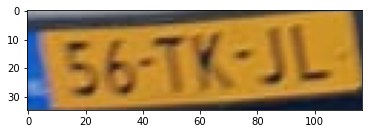

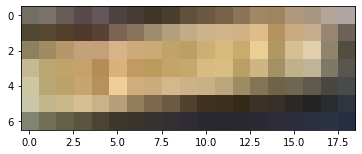

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/002.jpg


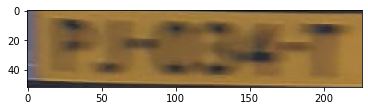

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/003.jpg


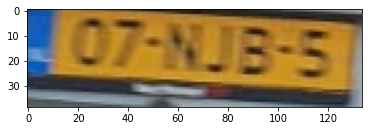

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/004.jpg


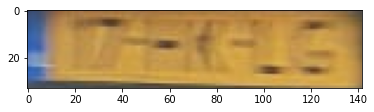

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/005.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/006.jpg


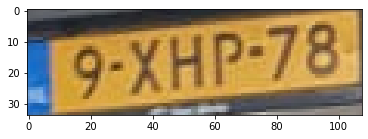

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/007.jpg


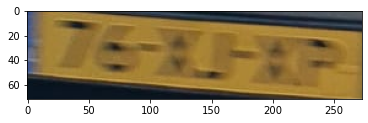

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/008.jpg


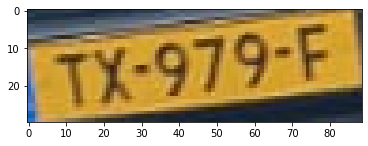

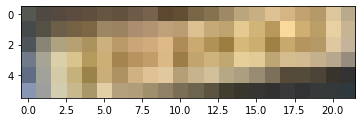

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/012.jpg


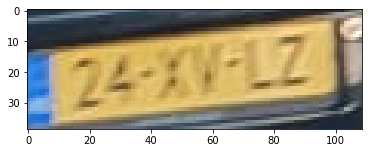

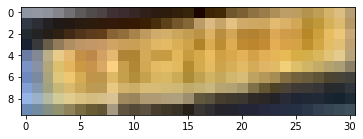

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/013.jpg


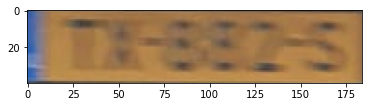

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/014.jpg


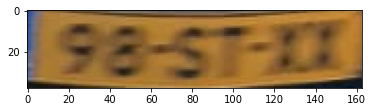

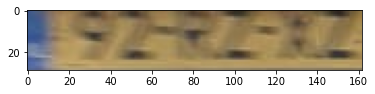

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/015.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/017.jpg


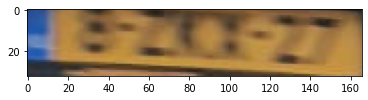

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/018.jpg


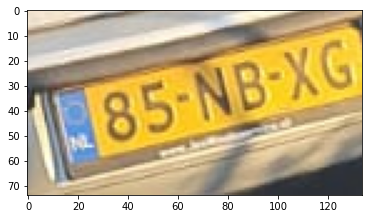

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/019.jpg


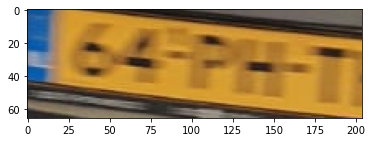

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/021.jpg


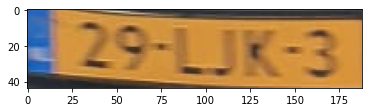

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/022.jpg


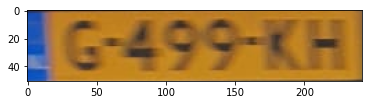

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/023.jpg


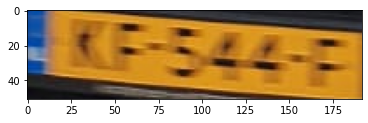

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/024.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/025.jpg


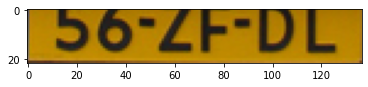

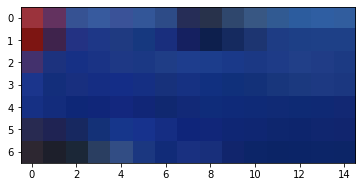

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/026.JPG


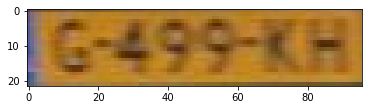

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/027.jpg


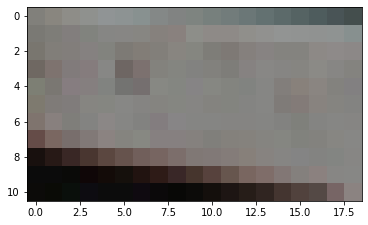

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/028.jpg


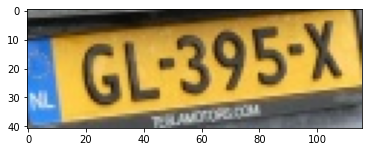

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/029.jpg


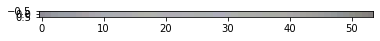

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/030.jpg


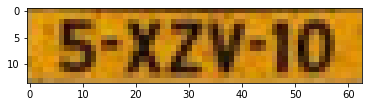

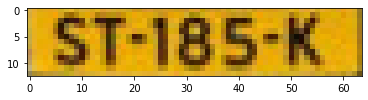

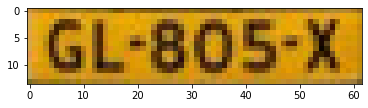

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/031.JPG
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/032.jpg


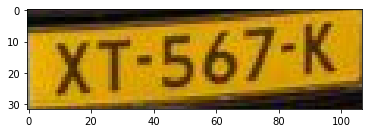

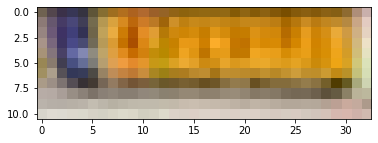

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/034.jpg


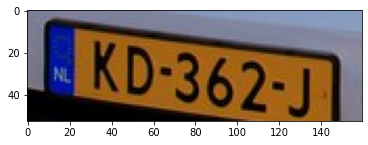

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/035.jpg


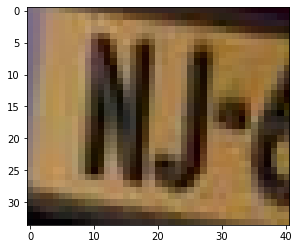

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/036.jpg


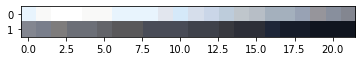

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/037.jpg


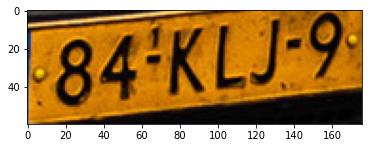

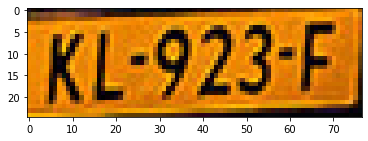

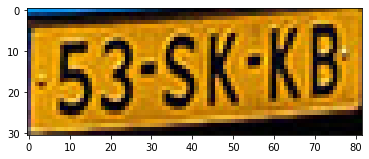

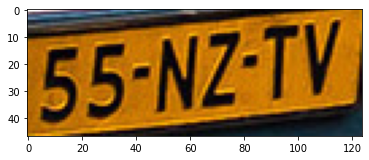

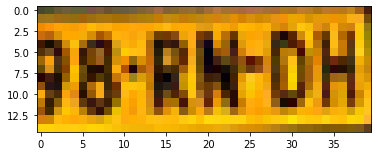

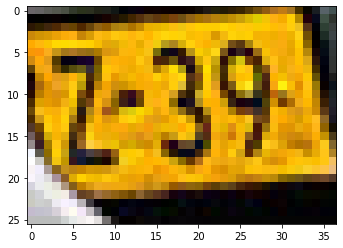

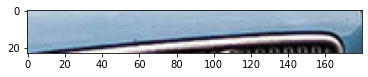

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/038.jpg


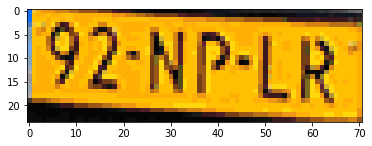

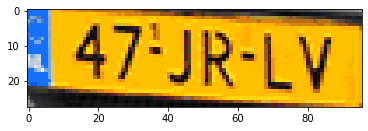

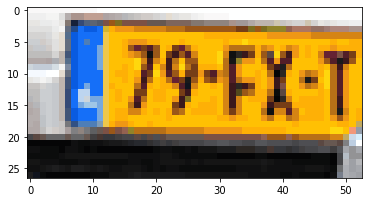

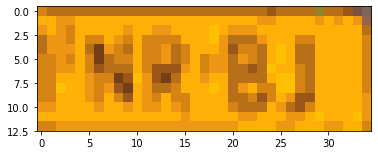

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/039.jpg


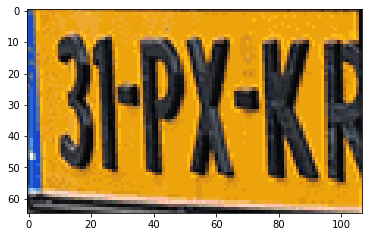

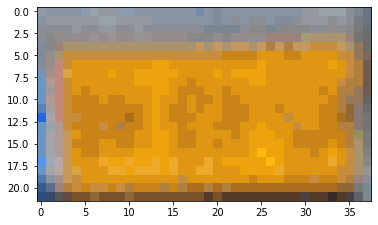

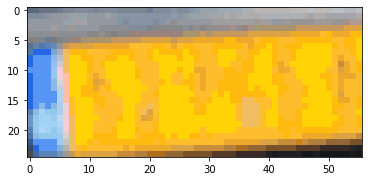

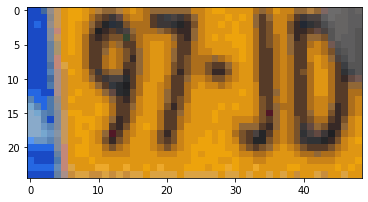

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/040.jpg


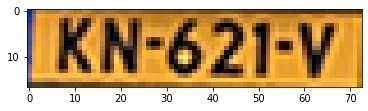

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/041.jpg


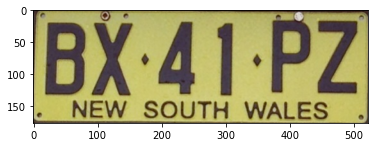

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/042.jpg


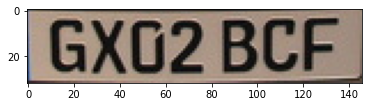

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/043.jpg


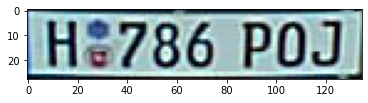

In [51]:
path = r"C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/"
counter = 0
files = os.listdir(path)
times = []

for pic in sorted(files):
    filename = os.fsdecode(pic)
    pic_path = path + filename
    print(pic_path)
    counter, time_spend = Detect_Plates(pic_path, model_vers3, counter, debug=False)
    times.append(time_spend)

In [52]:
print(sum(times)/len(times))

5.754906145302025


C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/001.jpg


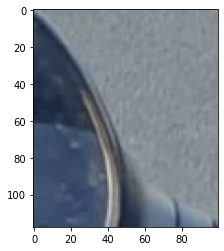

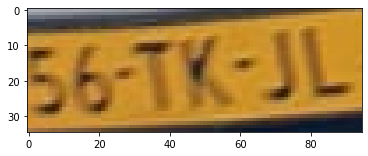

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/002.jpg


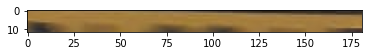

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/003.jpg


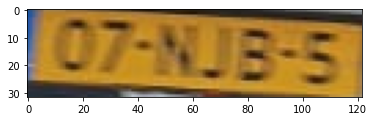

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/004.jpg


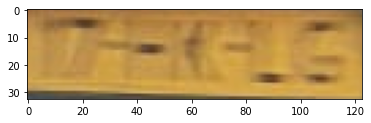

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/005.jpg


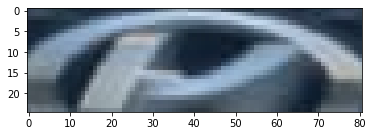

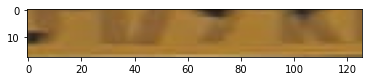

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/006.jpg


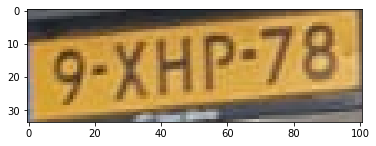

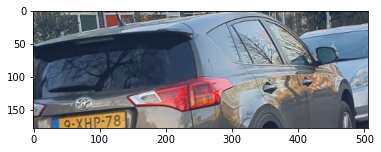

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/007.jpg


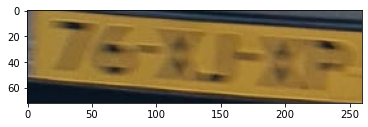

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/008.jpg


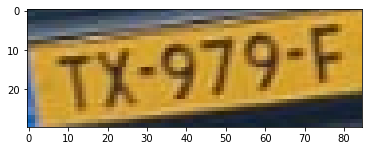

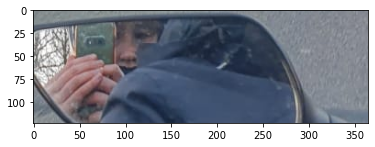

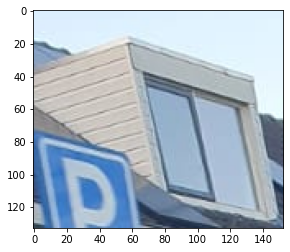

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/012.jpg


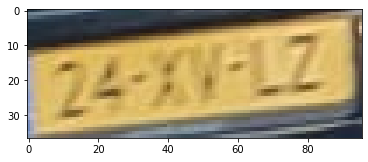

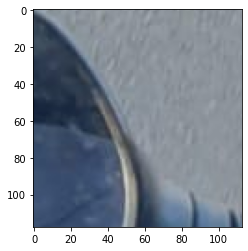

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/013.jpg


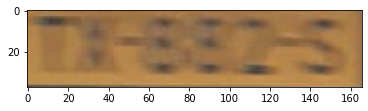

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/014.jpg


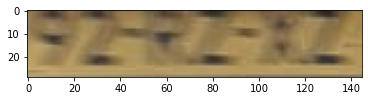

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/015.jpg


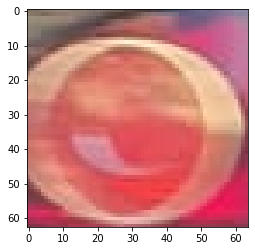

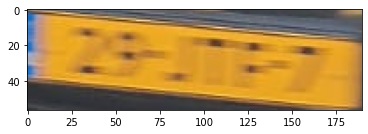

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/017.jpg


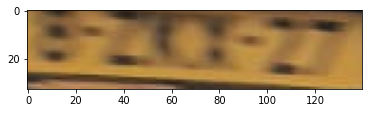

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/018.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/019.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/021.jpg


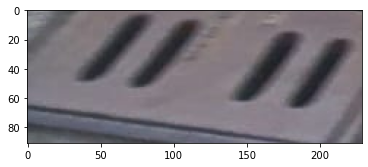

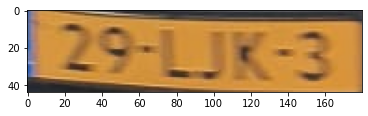

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/022.jpg


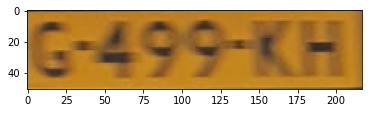

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/023.jpg


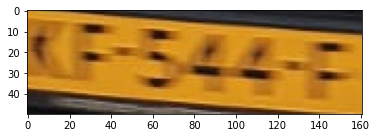

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/024.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/025.jpg


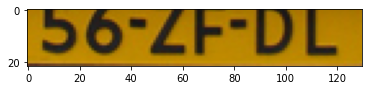

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/026.JPG


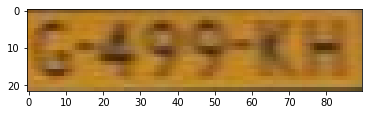

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/027.jpg


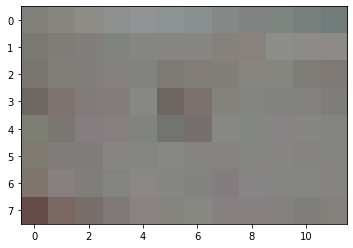

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/028.jpg


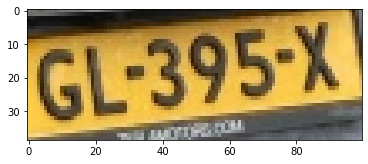

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/029.jpg


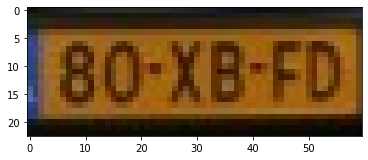

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/030.jpg


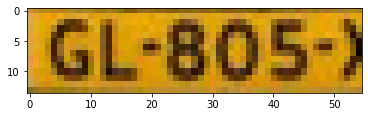

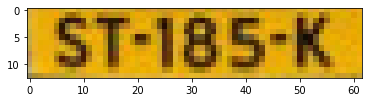

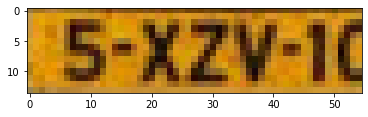

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/031.JPG


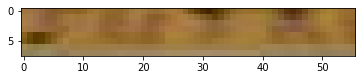

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/032.jpg


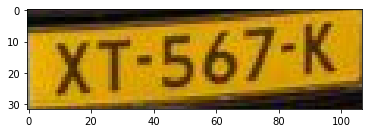

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/034.jpg


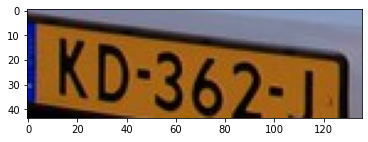

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/035.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/036.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/037.jpg


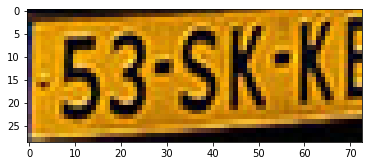

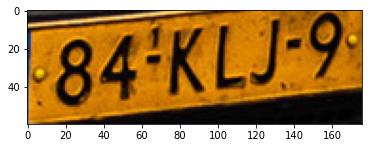

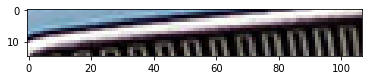

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/038.jpg


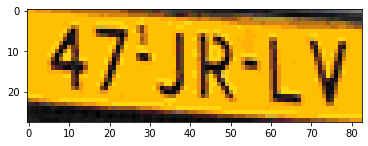

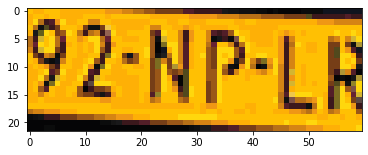

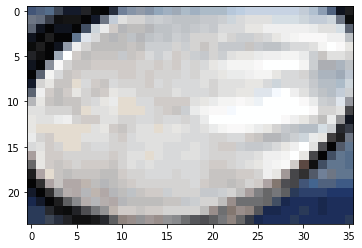

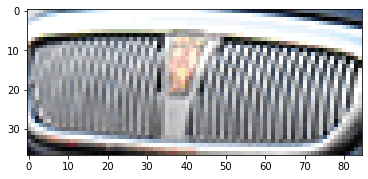

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/039.jpg


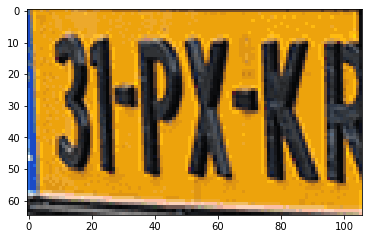

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/040.jpg


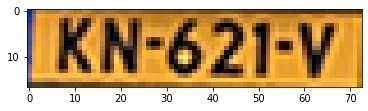

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/041.jpg


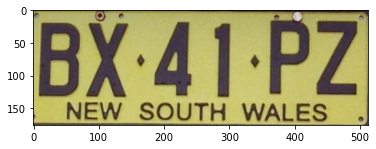

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/042.jpg


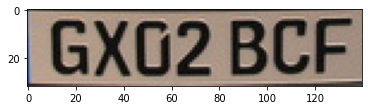

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/043.jpg


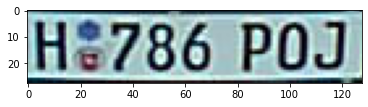

6.732527855280283


In [23]:
path = r"C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/"
counter = 0
files = os.listdir(path)
times = []

for pic in sorted(files):
    filename = os.fsdecode(pic)
    pic_path = path + filename
    print(pic_path)
    counter, time_spend = Detect_Plates(pic_path, model_vers1, counter, debug=False)
    times.append(time_spend)
print(sum(times)/len(times))

In [18]:
Tesseract_Complete_Evaluation(r"model_1/", lang="eng")

./Dataset/TesseractEvaluation/evaluation/model_1/001.jpg
Plates found: ['Be TK-SL', '56-TKSL', '561K SL', '56-TK-SL', 'Bb ThE', 'S6-TK-SL', '56TH SL']
56-TK-JL
Max accuracy: 0.8333333333333334
Speed: 5.941

./Dataset/TesseractEvaluation/evaluation/model_1/005.jpg
Plates found: ['1 O7-NIB-S |', '1 07-KIB-5)', '| G7-MIE-S', '| O7-NIB-S |', 'O7-NIR-S', '| O7-NIB-S', '| O7-KIB-S |', 'LOF-MIE-5-', '| O7-NIR-S']
07-NJB-5
Max accuracy: 0.6153846153846154
Speed: 5.78

./Dataset/TesseractEvaluation/evaluation/model_1/007.jpg
Plates found: ['rane ls', 'Tt Ges', 'Mette', 'rete', 'Ered ieee', 'iow tt', 'is tS', 'row fA', 'Tia ee', '[fire Ges']
17-HK-LG
Max accuracy: 0.18181818181818182
Speed: 5.361

./Dataset/TesseractEvaluation/evaluation/model_1/012.jpg
Plates found: ['g-XHP-78-', '9-XHP-78-', 'rg-XHP-78:', '9-KHP*78-', 'rg XHP-7 8:', 'g-KHP-7 8°', '9-XHP-78:', '9-KHP-7 8:', '9-KHP-78-', '9-KHP*78:']
9-XHP-78
Max accuracy: 1.0
Speed: 5.346

./Dataset/TesseractEvaluation/evaluation/model_1/015.jp

# Mask R-CNN model 2

In [102]:
plates = [["56-TK-JL"], ["PJ-034-T"], ["07-NJB-5"], 
         ["17-HK-LG"], ["J-179-RT"], ["9-XHP-78"],
         ["76-XJ-XP"], ["TX-979-F"], ["24-XV-LZ"],
         ["TX-882-S"], ["92-RZ-XZ"], ["98-ST-XX"], ["29-JTF-7"],
         ["8-ZKX-27"], ["85-NB-XG"],
         ["64-PH-TH"], ["29-LJK-3"],
         ["G-499-KH"], ["KF-544-F"],
         ["56-ZF-DL"], ["G-499-KH"],
         ["GL-395-X"], ["80-XB-FD"],["ST-185-K"], ["5-XZV-10"], ["GL-805-X"], 
         ["XT-567-K"],
         ["KD-362-J"], 
         ["84-KLJ-9"], ["53-SK-KB"],["KL-923-F"],["55-NZ-TV"], ["47-JR-LV"], ["92-NP-LR"],["31-PX-KR"],
         ["KN-621-V"],["GX02 BCF"], ["BX-41-PZ"]]
print(len(plates))

38


C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/001.jpg


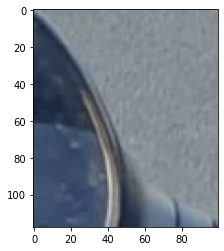

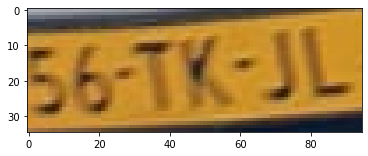

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/002.jpg


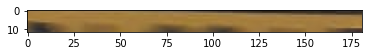

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/003.jpg


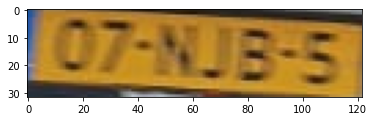

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/004.jpg


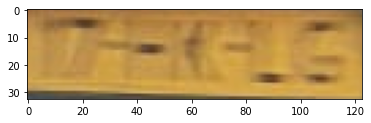

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/005.jpg


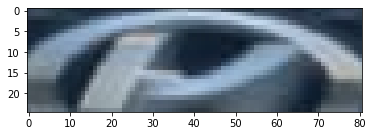

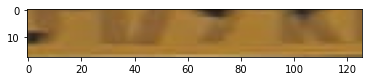

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/006.jpg


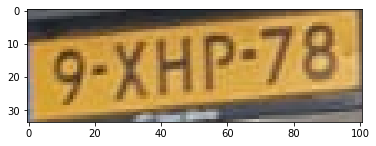

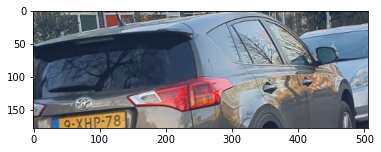

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/007.jpg


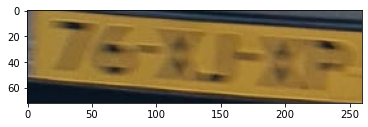

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/008.jpg


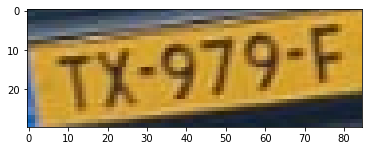

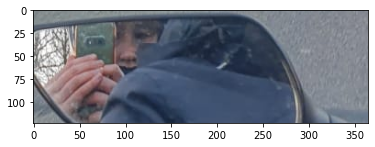

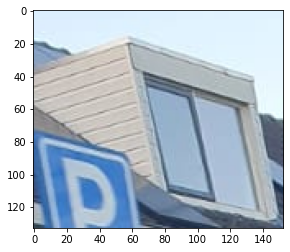

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/012.jpg


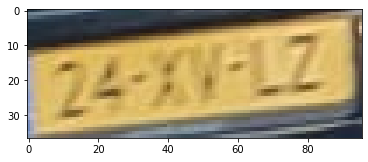

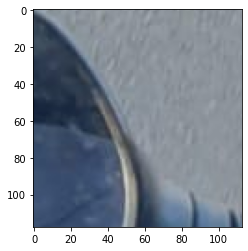

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/013.jpg


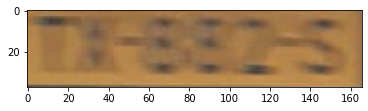

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/014.jpg


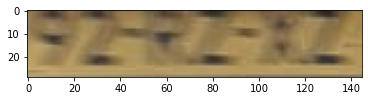

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/015.jpg


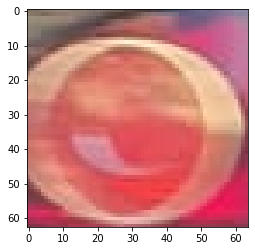

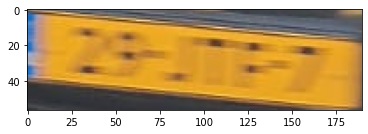

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/017.jpg


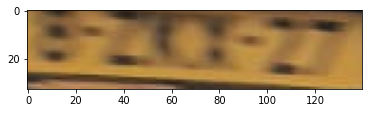

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/018.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/019.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/021.jpg


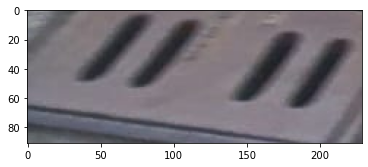

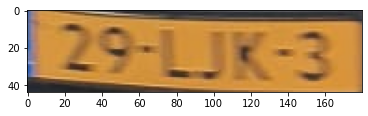

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/022.jpg


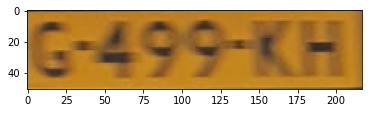

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/023.jpg


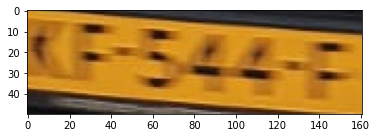

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/024.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/025.jpg


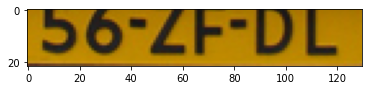

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/026.JPG


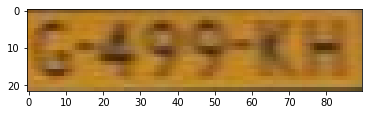

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/027.jpg


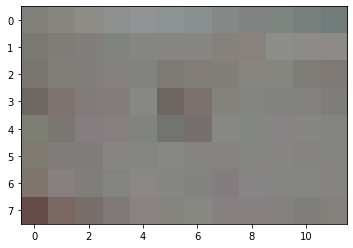

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/028.jpg


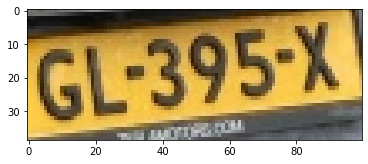

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/029.jpg


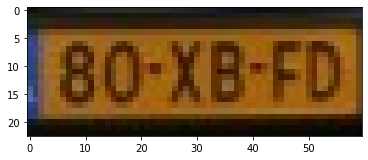

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/030.jpg


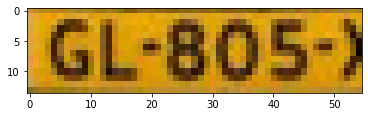

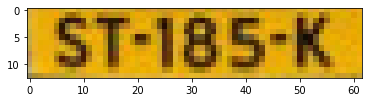

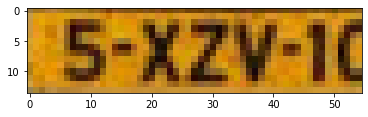

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/031.JPG


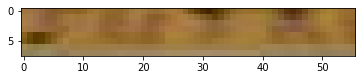

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/032.jpg


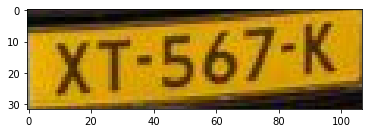

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/034.jpg


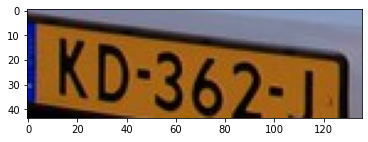

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/035.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/036.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/037.jpg


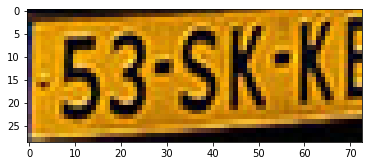

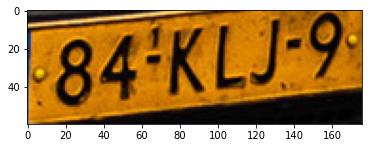

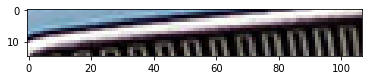

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/038.jpg


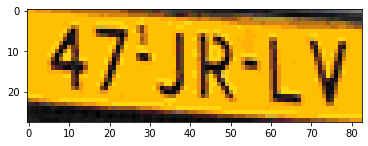

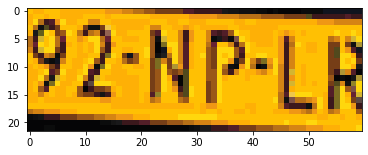

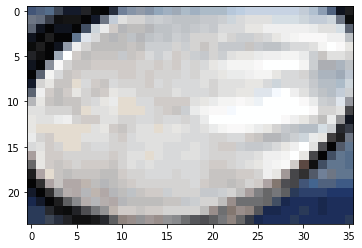

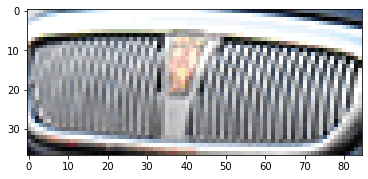

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/039.jpg


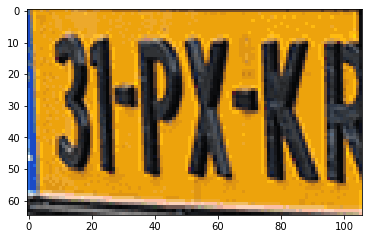

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/040.jpg


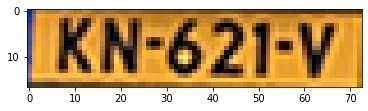

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/041.jpg


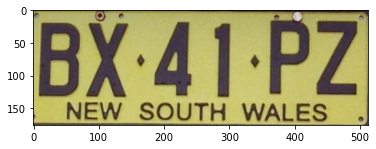

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/042.jpg


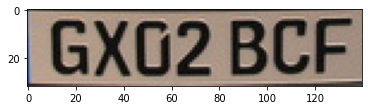

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/043.jpg


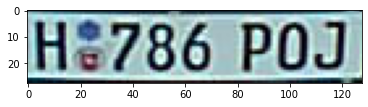

In [75]:
path = r"C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/"
counter = 0
files = os.listdir(path)

for pic in sorted(files):
    filename = os.fsdecode(pic)
    pic_path = path + filename
    print(pic_path)
    counter = Detect_Plates(pic_path, model_vers2, counter, debug=False)
    counter += 1

./Dataset/TesseractEvaluation/evaluation/model_2/001.jpg


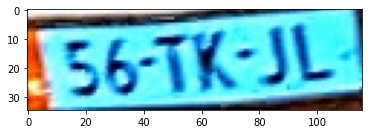

['FZ6 TK 3L', 'FC5 TK 3L', 'F565 TK 3L', 'LS6TK 3L', 'LS6 TK 3L', 'LC5 TK 3L', 'FC65 TK 3L']
Plates found: ['FZ6 TK 3L', 'FC5 TK 3L', 'F565 TK 3L', 'LS6TK 3L', 'LS6 TK 3L', 'LC5 TK 3L', 'FC65 TK 3L']
56-TK-JL
Max accuracy: 0.7142857142857143
Speed: 9.88

./Dataset/TesseractEvaluation/evaluation/model_2/002.jpg


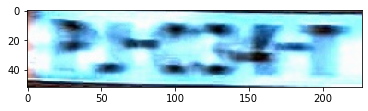

KeyboardInterrupt: 

In [61]:
Tesseract_Complete_Evaluation(r"model_2/")

# Model 3

In [75]:
plates = [["56-TK-JL"], ["PJ-034-T"], ["07-NJB-5"], 
         ["17-HK-LG"], ["9-XHP-78"],
         ["76-XJ-XP"], ["TX-979-F"], ["24-XV-LZ"],
         ["TX-882-S"], ["98-ST-XX"], ["92-RZ-XZ"], ["8-ZKX-27"], ["85-NB-XG"],
         ["64-PH-T"], ["29-LJK-3"],
         ["G-499-KH"], ["KF-544-F"], ["56-ZF-DL"], ["G-499-KH"],
         ["GL-395-X"], ["5-XZY-10"], 
         ["ST-185-K"], ["GL-805-X"], ["XT-567-K"], ["KD-362-J"], 
         ["84-KLJ-9"], ["KL-923-F"], ["53-SK-KB"], ["55-NZ-TV"], ["98-RN-DH"], ["92-NP-LR"],  
         ["47-JR-LV"], ["31-PX-KR"],
         ["KN-621-V"], ["BX-41-PZ"],
         ["GX02 BCF"], ["H 786 POJ"]]
print(len(plates))

37


C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/001.jpg


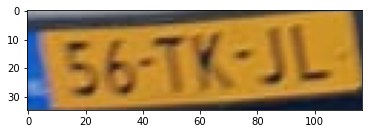

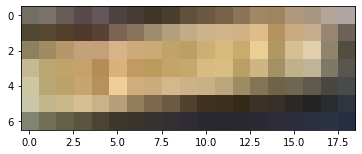

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/002.jpg


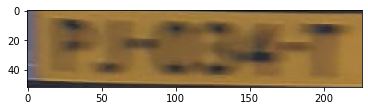

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/003.jpg


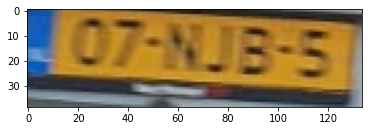

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/004.jpg


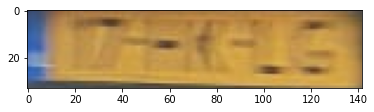

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/005.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/006.jpg


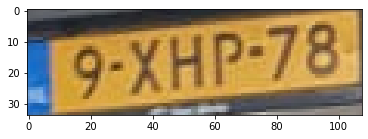

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/007.jpg


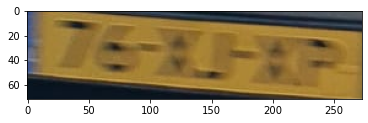

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/008.jpg


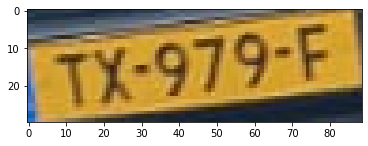

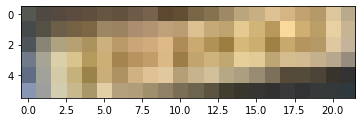

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/012.jpg


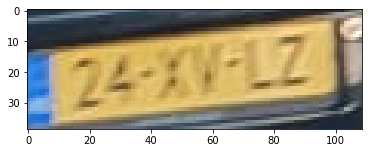

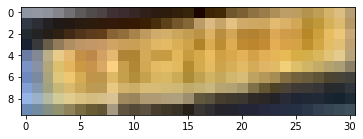

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/013.jpg


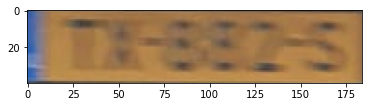

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/014.jpg


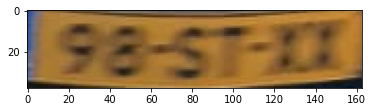

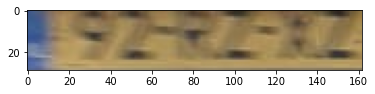

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/015.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/017.jpg


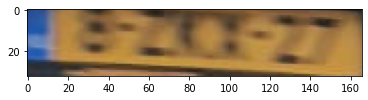

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/018.jpg


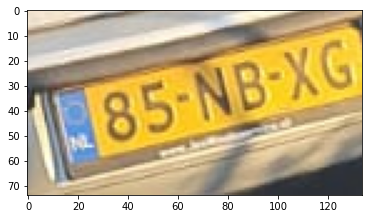

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/019.jpg


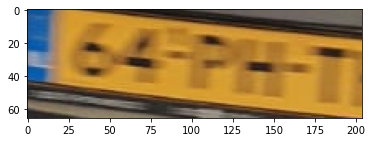

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/021.jpg


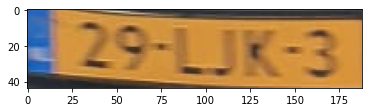

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/022.jpg


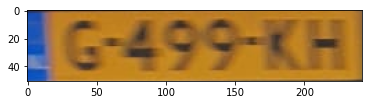

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/023.jpg


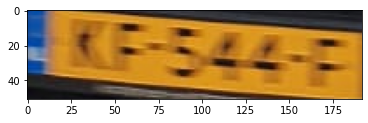

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/024.jpg
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/025.jpg


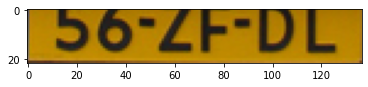

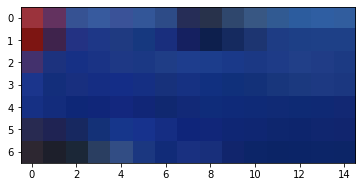

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/026.JPG


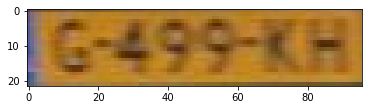

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/027.jpg


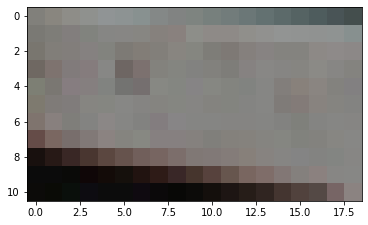

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/028.jpg


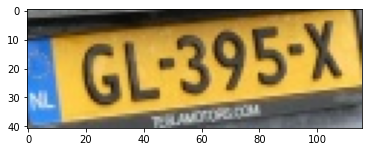

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/029.jpg


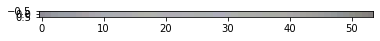

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/030.jpg


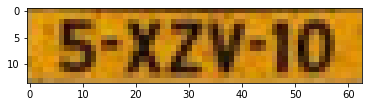

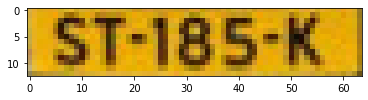

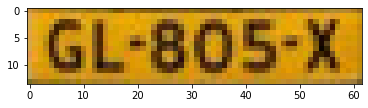

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/031.JPG
C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/032.jpg


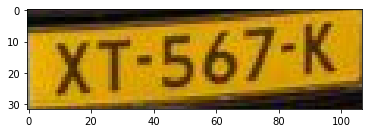

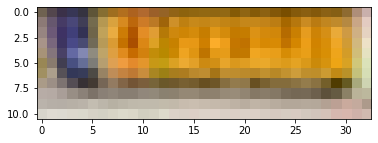

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/034.jpg


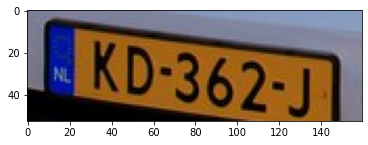

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/035.jpg


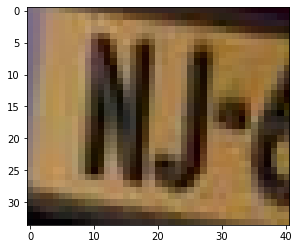

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/036.jpg


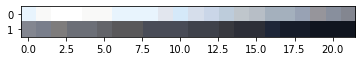

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/037.jpg


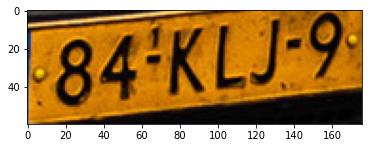

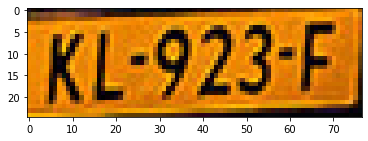

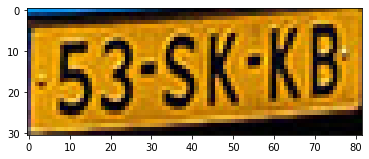

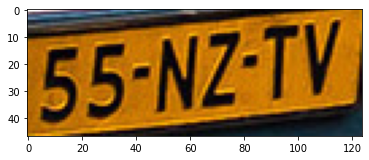

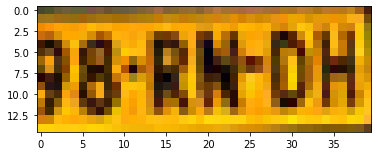

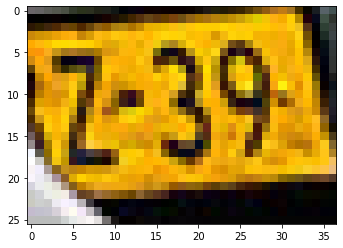

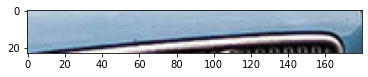

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/038.jpg


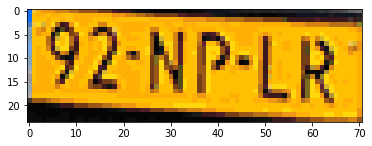

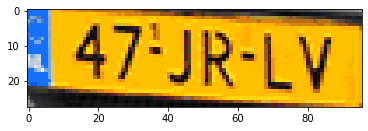

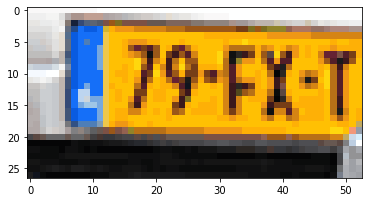

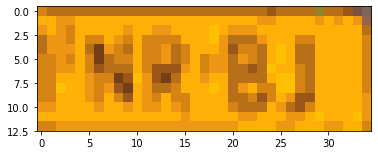

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/039.jpg


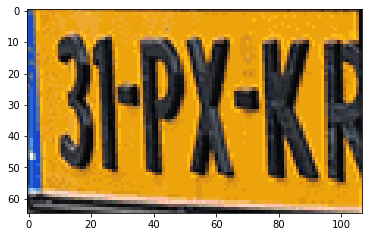

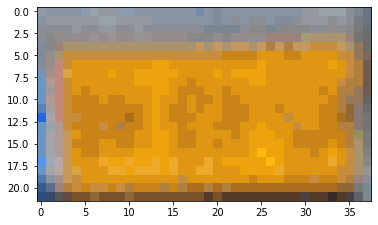

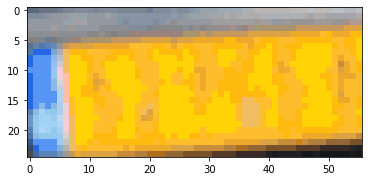

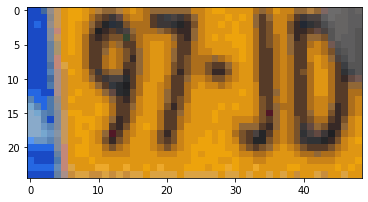

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/040.jpg


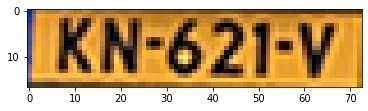

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/041.jpg


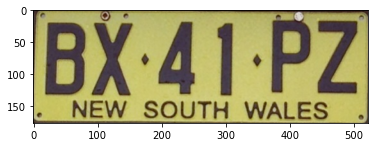

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/042.jpg


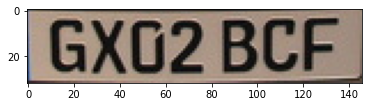

C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/043.jpg


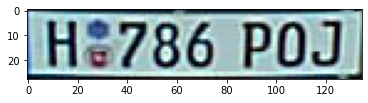

In [74]:
path = r"C:/Users/midni/Desktop/School/INNO/opencv-anpr/license_plates/group3/"
counter = 0
files = os.listdir(path)

for pic in sorted(files):
    filename = os.fsdecode(pic)
    pic_path = path + filename
    print(pic_path)
    data = Detect_Plates(pic_path, model_vers3, counter, debug=False)
    counter += data[0]

./Dataset/TesseractEvaluation/evaluation/model_3/000.png


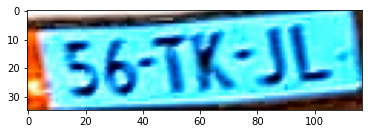

['LS65 TK 3L', 'LS6 TH 3L', 'FS6 TK 3L', 'FS5 TK 3L 1', 'FS6TK 3L', 'IS6 TV 3L', 'LS6 TK 3L']
Plates found: ['LS65 TK 3L', 'LS6 TH 3L', 'FS6 TK 3L', 'FS5 TK 3L 1', 'FS6TK 3L', 'IS6 TV 3L', 'LS6 TK 3L']
56-TK-JL
Max accuracy: 0.6153846153846154
Speed: 5.578

./Dataset/TesseractEvaluation/evaluation/model_3/002.png


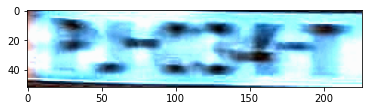

[' 3  Z35E T', '2  ZS8 T', ' PS ZS8 T', ' DS CS8 T', '2  Z3E T', ' 2 S Z3E T', ' 2S ZSE T', ' 2  ZSE T', '2  ZSEL T']
Plates found: [' 3  Z35E T', '2  ZS8 T', ' PS ZS8 T', ' DS CS8 T', '2  Z3E T', ' 2 S Z3E T', ' 2S ZSE T', ' 2  ZSE T', '2  ZSEL T']
PJ-034-T
Max accuracy: 0.36363636363636365
Speed: 6.119

./Dataset/TesseractEvaluation/evaluation/model_3/003.png


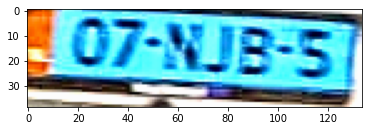

['LO7 NJB 5T', 'L O7 XJB 5T', 'L07 XJB 51', 'S C7 X2 3T', 'R C7 XJ2 57T', 'E C7 XJ2 ST', 'L 0Z NJB 51', 'L 07 XJB 5T']
Plates found: ['LO7 NJB 5T', 'L O7 XJB 5T', 'L07 XJB 51', 'S C7 X2 3T', 'R C7 XJ2 57T', 'E C7 XJ2 ST', 'L 0Z NJB 51', 'L 07 XJB 5T']
07-NJB-5
Max accuracy: 0.7142857142857143
Speed: 5.524

./Dataset/TesseractEvaluation/evaluation/model_3/004.png


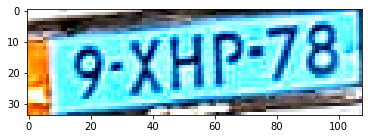

['FG XHP Z8', 'F9 XHP 78', 'F9 XHDP 78', 'F9 XHP Z8']
Plates found: ['FG XHP Z8', 'F9 XHP 78', 'F9 XHDP 78', 'F9 XHP Z8']
17-HK-LG
Max accuracy: 0.15384615384615385
Speed: 4.959

./Dataset/TesseractEvaluation/evaluation/model_3/005.png


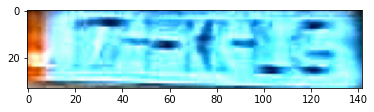

['E T 1 Z7', 'E TT Z¥ L Z1', 'E T —1 L Z1', 'F T C  Z1', 'E  ¢ L Z1', '7 77 E BZ4', 'P 7X 2Z9', 'F 7 1 E Z1', 'F 7X X Z9', 'F T —X L Z9']
Plates found: ['E T 1 Z7', 'E TT Z¥ L Z1', 'E T —1 L Z1', 'F T C  Z1', 'E  ¢ L Z1', '7 77 E BZ4', 'P 7X 2Z9', 'F 7 1 E Z1', 'F 7X X Z9', 'F T —X L Z9']
9-XHP-78
Max accuracy: 0.3333333333333333
Speed: 5.135

./Dataset/TesseractEvaluation/evaluation/model_3/006.png


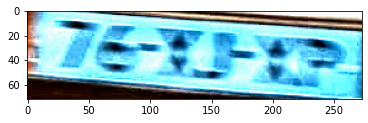

['LS Y  1T', 'L S T TS', 'LZ T TS', ' 7E T5 C2', 'LS T  T', 'L Z T 1S', 'LS T TS', 'L Z YF TS']
Plates found: ['LS Y  1T', 'L S T TS', 'LZ T TS', ' 7E T5 C2', 'LS T  T', 'L Z T 1S', 'LS T TS', 'L Z YF TS']
76-XJ-XP
Max accuracy: 0.16666666666666666
Speed: 7.46

./Dataset/TesseractEvaluation/evaluation/model_3/007.png


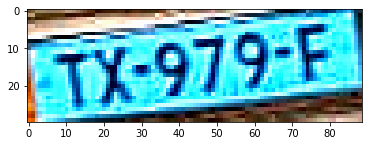

['TY 972 E', 'TX 972 Z', 'TY 972E', 'TY 979 E', 'TX972E', 'TX 973 E']
Plates found: ['TY 972 E', 'TX 972 Z', 'TY 972E', 'TY 979 E', 'TX972E', 'TX 973 E']
TX-979-F
Max accuracy: 0.6666666666666666
Speed: 4.794

./Dataset/TesseractEvaluation/evaluation/model_3/008.png


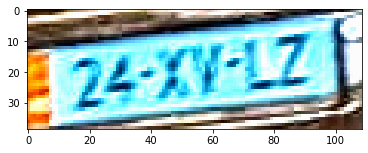

['F72Z 71LZ L', 'F7Z 71 ZJ', 'F7Z 77 ZJ', 'F7Z 77 LZ J', 'F7Z 77 LZ', 'F7Z 7 ZJ', 'F2  ZJ', 'F 7ZJ', 'FZ 7 ZJ']
Plates found: ['F72Z 71LZ L', 'F7Z 71 ZJ', 'F7Z 77 ZJ', 'F7Z 77 LZ J', 'F7Z 77 LZ', 'F7Z 7 ZJ', 'F2  ZJ', 'F 7ZJ', 'FZ 7 ZJ']
24-XV-LZ
Max accuracy: 0.4
Speed: 4.975

./Dataset/TesseractEvaluation/evaluation/model_3/009.png


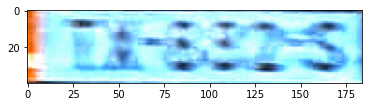

['F LE8Z2 S', 'V 2 22Z S', 'V T3 22Z S', 'I TE Z3Z S', 'V T2 22Z S', 'V T4 Z3Z S', 'F LE 522 S', 'L 1 T Z', 'V LE 822 S', 'F TE Z32S']
Plates found: ['F LE8Z2 S', 'V 2 22Z S', 'V T3 22Z S', 'I TE Z3Z S', 'V T2 22Z S', 'V T4 Z3Z S', 'F LE 522 S', 'L 1 T Z', 'V LE 822 S', 'F TE Z32S']
TX-882-S
Max accuracy: 0.46153846153846156
Speed: 5.808

./Dataset/TesseractEvaluation/evaluation/model_3/010.png


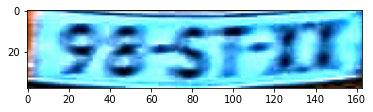

['L 98 ST ZX', ' S5 ST ZL', ' SZ ST X1', ' SE ST ZX', ' SZ ST XT', 'L 95 ST KX', 'L 96 ST EX', ' 98 ST ZX', ' 98 ST XX', ' SE ST ZL']
Plates found: ['L 98 ST ZX', ' S5 ST ZL', ' SZ ST X1', ' SE ST ZX', ' SZ ST XT', 'L 95 ST KX', 'L 96 ST EX', ' 98 ST ZX', ' 98 ST XX', ' SE ST ZL']
98-ST-XX
Max accuracy: 1.0
Speed: 5.651

./Dataset/TesseractEvaluation/evaluation/model_3/015.png


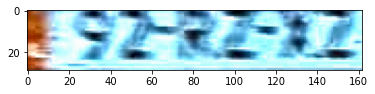

['8 7Z XZ 8 Z', '8 9Z RZ Z Z', '8 7Z CZ 8 Z', ' SZ RZ ZZ', 'E 7Z XZ F L', '8 C Z CC 8 Z', 'E SZ EZ XZZ', 'E 7Z XZ 2 Z', 'E 5Z XZ X Z', 'X Z CC 8 Z']
Plates found: ['8 7Z XZ 8 Z', '8 9Z RZ Z Z', '8 7Z CZ 8 Z', ' SZ RZ ZZ', 'E 7Z XZ F L', '8 C Z CC 8 Z', 'E SZ EZ XZZ', 'E 7Z XZ 2 Z', 'E 5Z XZ X Z', 'X Z CC 8 Z']
92-RZ-XZ
Max accuracy: 0.6153846153846154
Speed: 5.45

./Dataset/TesseractEvaluation/evaluation/model_3/016.png


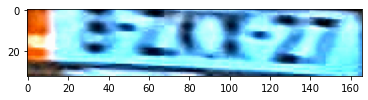

['3 2 LCX Z7', 'L Z 4CT Z7', 'L Z 4CY Z7', '5 S £CX Z7', 'L S 4LX Z7', '3 Z 4CX Z7', '3 Z 4CY Z7', 'L  8Y ZT', 'L S  8T ZT', 'L Z  EY ZT']
Plates found: ['3 2 LCX Z7', 'L Z 4CT Z7', 'L Z 4CY Z7', '5 S £CX Z7', 'L S 4LX Z7', '3 Z 4CX Z7', '3 Z 4CY Z7', 'L  8Y ZT', 'L S  8T ZT', 'L Z  EY ZT']
8-ZKX-27
Max accuracy: 0.46153846153846156
Speed: 5.402

./Dataset/TesseractEvaluation/evaluation/model_3/017.png


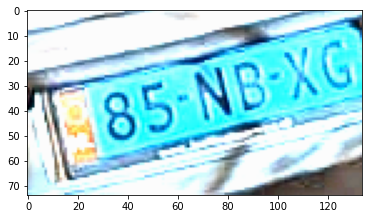

['T5S', 'IC', 'T T', 'C', 'T5T']
Plates found: ['T5S', 'IC', 'T T', 'C', 'T5T']
85-NB-XG
Max accuracy: 0.2222222222222222
Speed: 7.067

./Dataset/TesseractEvaluation/evaluation/model_3/018.png


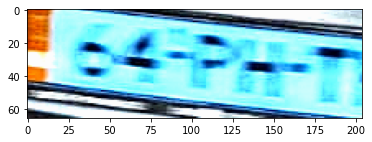

['E S2  T', 'E SS  T', 'L Z2 T T', 'E SS DZT', 'L S2 T T', 'E S2 D T', 'L SS D T']
Plates found: ['E S2  T', 'E SS  T', 'L Z2 T T', 'E SS DZT', 'L S2 T T', 'E S2 D T', 'L SS D T']
64-PH-T
Max accuracy: 0.2222222222222222
Speed: 6.285

./Dataset/TesseractEvaluation/evaluation/model_3/019.png


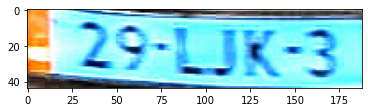

['Z 2S 1 JX 3', 'Z 2S L IK 3', 'Z 23  C 3', 'Z 2S 1 1X 3', 'Z 29 1 JK 3', 'Z 25 1 1X 3', 'Z 2S 1 1K 3', 'S 29 L JK 3', 'Z 23 L C 3']
Plates found: ['Z 2S 1 JX 3', 'Z 2S L IK 3', 'Z 23  C 3', 'Z 2S 1 1X 3', 'Z 29 1 JK 3', 'Z 25 1 1X 3', 'Z 2S 1 1K 3', 'S 29 L JK 3', 'Z 23 L C 3']
29-LJK-3
Max accuracy: 0.9230769230769231
Speed: 5.717

./Dataset/TesseractEvaluation/evaluation/model_3/020.png


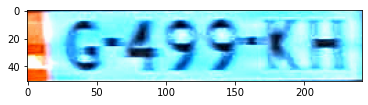

['LG 477 C', 'AG 499 KH', 'LG Z99 K5', 'L C 475 C', 'LG Z99 K', 'L GC 477 L', 'LG 455 X', 'LG 499 K', 'LG 4959 KH']
Plates found: ['LG 477 C', 'AG 499 KH', 'LG Z99 K5', 'L C 475 C', 'LG Z99 K', 'L GC 477 L', 'LG 455 X', 'LG 499 K', 'LG 4959 KH']
G-499-KH
Max accuracy: 0.9230769230769231
Speed: 6.396

./Dataset/TesseractEvaluation/evaluation/model_3/021.png


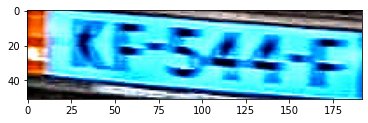

['LCZ SE2 C', 'LKF 5Z2 E', 'LSC Z2C C', 'LEZ SZ4 C', 'LEF 524 E', 'LCZ S2£4 E', 'LKF 5Z4 E', 'LEF SZ4 E', 'LCZ S2C C', 'L EF 524 L']
Plates found: ['LCZ SE2 C', 'LKF 5Z2 E', 'LSC Z2C C', 'LEZ SZ4 C', 'LEF 524 E', 'LCZ S2£4 E', 'LKF 5Z4 E', 'LEF SZ4 E', 'LCZ S2C C', 'L EF 524 L']
KF-544-F
Max accuracy: 0.6153846153846154
Speed: 6.054

./Dataset/TesseractEvaluation/evaluation/model_3/023.png


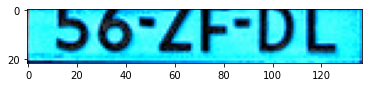

[' 9O ZF UL', ' 9O ZF U L', ' 9O7ZF DL', '9O ZF U L', ' D9O ZF UL']
Plates found: [' 9O ZF UL', ' 9O ZF U L', ' 9O7ZF DL', '9O ZF U L', ' D9O ZF UL']
56-ZF-DL
Max accuracy: 0.6153846153846154
Speed: 4.941

./Dataset/TesseractEvaluation/evaluation/model_3/024.png


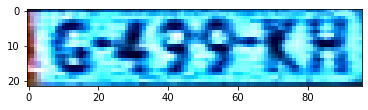

['G472 KH', ' G £479 KH', ' G £79 KH', 'G429 LH', 'G £29 LH', 'GX92 KA', ' G 472 KH', '1GX22 KH', 'GZ92 LH']
Plates found: ['G472 KH', ' G £479 KH', ' G £79 KH', 'G429 LH', 'G £29 LH', 'GX92 KA', ' G 472 KH', '1GX22 KH', 'GZ92 LH']
G-499-KH
Max accuracy: 0.8333333333333334
Speed: 4.826

./Dataset/TesseractEvaluation/evaluation/model_3/025.png


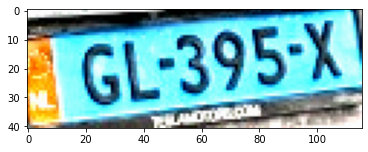

['T GL 393X', 'Y GL 393X', 'TGL 393X', 'FGL 393L', 'F GL 393X', '7 GL 393X', 'TGL 392X', 'A GL 37 2L']
Plates found: ['T GL 393X', 'Y GL 393X', 'TGL 393X', 'FGL 393L', 'F GL 393X', '7 GL 393X', 'TGL 392X', 'A GL 37 2L']
GL-395-X
Max accuracy: 0.7692307692307693
Speed: 5.313

./Dataset/TesseractEvaluation/evaluation/model_3/026.png


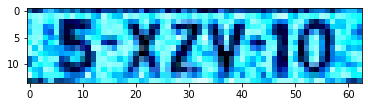

['E XZV I0', '5 XZV 10', 'B XZY 10', '7B XZY 10', ' B XZY 10', ' 5 XZV 10', 'B XZV 10', 'E X2V 30']
Plates found: ['E XZV I0', '5 XZV 10', 'B XZY 10', '7B XZY 10', ' B XZY 10', ' 5 XZV 10', 'B XZV 10', 'E X2V 30']
5-XZY-10
Max accuracy: 0.8333333333333334
Speed: 4.54

./Dataset/TesseractEvaluation/evaluation/model_3/027.png


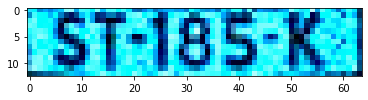

['ST 185 K J', ' ST 1B3 K J', ' ST 185 K J', ' ST1B3 K', ' ST 1B3 K I', ' ST 1B5 K J']
Plates found: ['ST 185 K J', ' ST 1B3 K J', ' ST 185 K J', ' ST1B3 K', ' ST 1B3 K I', ' ST 1B5 K J']
ST-185-K
Max accuracy: 0.9230769230769231
Speed: 4.49

./Dataset/TesseractEvaluation/evaluation/model_3/028.png


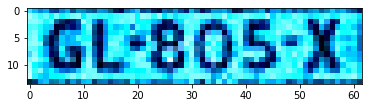

['GL 805 XI', 'GL805 X4', '68L 805 X4', 'BL 805 X4', 'GL805 XI', 'BL805 X4', 'GL 805 X1']
Plates found: ['GL 805 XI', 'GL805 X4', '68L 805 X4', 'BL 805 X4', 'GL805 XI', 'BL805 X4', 'GL 805 X1']
GL-805-X
Max accuracy: 0.9230769230769231
Speed: 4.396

./Dataset/TesseractEvaluation/evaluation/model_3/029.png


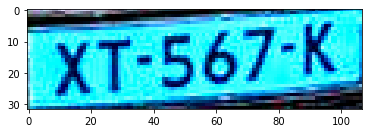

['XT 567 K', 'XT 567 L']
Plates found: ['XT 567 K', 'XT 567 L']
XT-567-K
Max accuracy: 1.0
Speed: 4.868

./Dataset/TesseractEvaluation/evaluation/model_3/030.png


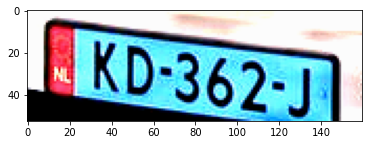

['ZKD 35771', 'EKD 3577I', 'EKD35ZT1', 'ZKD 35Z71', 'BKD 35771', 'EKD 35771', 'EKD 35Z7I', '8KD 35771']
Plates found: ['ZKD 35771', 'EKD 3577I', 'EKD35ZT1', 'ZKD 35Z71', 'BKD 35771', 'EKD 35771', 'EKD 35Z7I', '8KD 35771']
KD-362-J
Max accuracy: 0.42857142857142855
Speed: 5.588

./Dataset/TesseractEvaluation/evaluation/model_3/031.png


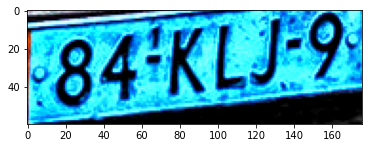

['84KL1ZZ', '84KLZZ', '84KLZ', '84 KLLZ', '84KLJZ']
Plates found: ['84KL1ZZ', '84KLZZ', '84KLZ', '84 KLLZ', '84KLJZ']
84-KLJ-9
Max accuracy: 0.8333333333333334
Speed: 6.829

./Dataset/TesseractEvaluation/evaluation/model_3/032.png


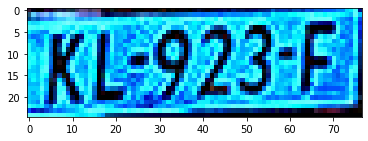

['KE923 E', 'KL2923 F', 'KL2923 E', 'KL923 E', 'KI 923 E', 'XL923 E']
Plates found: ['KE923 E', 'KL2923 F', 'KL2923 E', 'KL923 E', 'KI 923 E', 'XL923 E']
KL-923-F
Max accuracy: 0.9230769230769231
Speed: 4.872

./Dataset/TesseractEvaluation/evaluation/model_3/033.png


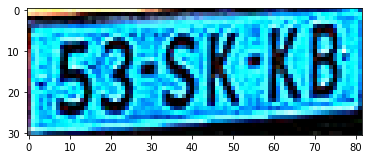

['53 SKK8', '53 SKKB', '53 SKK5', '53 SKK3']
Plates found: ['53 SKK8', '53 SKKB', '53 SKK5', '53 SKK3']
53-SK-KB
Max accuracy: 1.0
Speed: 5.153

./Dataset/TesseractEvaluation/evaluation/model_3/034.png


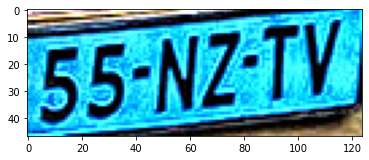

['55 NZ1L', '55 NZ IV', '55 NZTU', '55 NZ TV', '55 NZTV']
Plates found: ['55 NZ1L', '55 NZ IV', '55 NZTU', '55 NZ TV', '55 NZTV']
55-NZ-TV
Max accuracy: 1.0
Speed: 5.62

./Dataset/TesseractEvaluation/evaluation/model_3/035.png


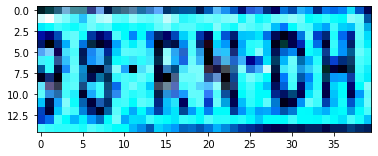

['75 RX DK', '78 RX DH', '75 RFDK', '78 RNDH', '78 RX BH', '78 RIDH', 'J8 RN BH', '7B RXDH']
Plates found: ['75 RX DK', '78 RX DH', '75 RFDK', '78 RNDH', '78 RX BH', '78 RIDH', 'J8 RN BH', '7B RXDH']
98-RN-DH
Max accuracy: 0.8333333333333334
Speed: 4.379

./Dataset/TesseractEvaluation/evaluation/model_3/036.png


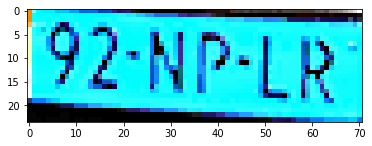

['92 NP LR']
Plates found: ['92 NP LR']
92-NP-LR
Max accuracy: 1.0
Speed: 4.393

./Dataset/TesseractEvaluation/evaluation/model_3/037.png


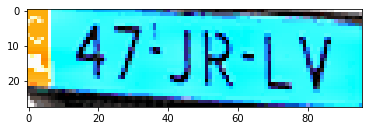

['47 JR LV', ' 47 JR LV', 'L47 JR LV']
Plates found: ['47 JR LV', ' 47 JR LV', 'L47 JR LV']
47-JR-LV
Max accuracy: 1.0
Speed: 4.572

./Dataset/TesseractEvaluation/evaluation/model_3/038.png


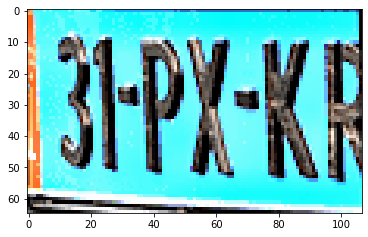

['EIZZT', 'EIZLT', 'EILZT', 'EIZT', '3IPIKF', '3IP1 KF', '3IP1 KI', '3IP1 HI']
Plates found: ['EIZZT', 'EIZLT', 'EILZT', 'EIZT', '3IPIKF', '3IP1 KF', '3IP1 KI', '3IP1 HI']
31-PX-KR
Max accuracy: 0.5
Speed: 5.462

./Dataset/TesseractEvaluation/evaluation/model_3/039.png


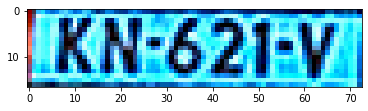

[' KH 621 V', ' KN 621V', ' KN 6Z21 V', ' KN 521 V', ' KN 6Z1V', ' KN621V I', ' KN 621 V']
Plates found: [' KH 621 V', ' KN 621V', ' KN 6Z21 V', ' KN 521 V', ' KN 6Z1V', ' KN621V I', ' KN 621 V']
KN-621-V
Max accuracy: 1.0
Speed: 4.534

./Dataset/TesseractEvaluation/evaluation/model_3/040.png


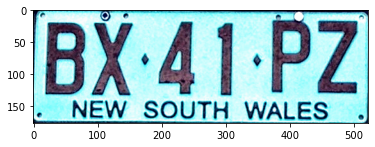

['BX 41 PZ', 'BX 4 1 PZ']
Plates found: ['BX 41 PZ', 'BX 4 1 PZ']
BX-41-PZ
Max accuracy: 1.0
Speed: 17.284

./Dataset/TesseractEvaluation/evaluation/model_3/042.png


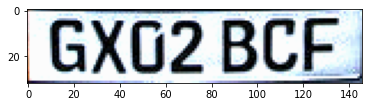

[' GX0Z2 BCF J', ' GXUZ BCFE J', ' GX02 BCF J', ' GX02 BCF']
Plates found: [' GX0Z2 BCF J', ' GXUZ BCFE J', ' GX02 BCF J', ' GX02 BCF']
GX02 BCF
Max accuracy: 1.0
Speed: 5.2

./Dataset/TesseractEvaluation/evaluation/model_3/043.png


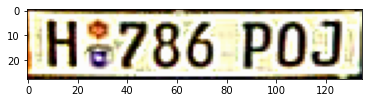

['IH8786 PDJ I', 'HS786 P0J', 'IH8786 PDJ', ' H3786 P0J 1', 'IH8786 P0JI', 'H8786 P0J', 'H8786 PDJ', 'H8786 PDJ I', ' HS786 P0J']
Plates found: ['IH8786 PDJ I', 'HS786 P0J', 'IH8786 PDJ', ' H3786 P0J 1', 'IH8786 P0JI', 'H8786 P0J', 'H8786 PDJ', 'H8786 PDJ I', ' HS786 P0J']
H 786 POJ
Max accuracy: 0.8
Speed: 5.138

Average time: 5.696540540540539
Average accuracy: 0.7047031047031047


In [79]:
Tesseract_Complete_Evaluation(r"model_3/", lang="plate_model_4")

./Dataset/TesseractEvaluation/evaluation/model_3/000.png


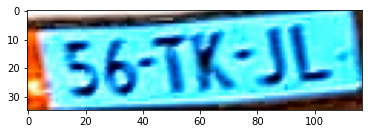

Plates found: ['SZ EZ', 'JSW0AU', 'F8840SAU', 'SE ZZ', '8848S', 'SBE', 'SB ZZ', '5S', 'SZ ZT', '8482S']
56-TK-JL
Max accuracy: 0.25
Speed: 4.113

./Dataset/TesseractEvaluation/evaluation/model_3/002.png


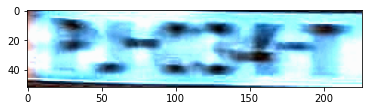

Plates found: ['GZ WZ AT', 'LZ 7 WZZ', 'UZ 7 GZ', 'LCZ ZZ ZF', 'ZL7 ZZ', 'LCZ AZ AZ', 'LCS SZ AST', 'ZZ ZZ ZF', 'GZ SZ AST', 'LZ ZW ZZ']
PJ-034-T
Max accuracy: 0.16666666666666666
Speed: 4.886

./Dataset/TesseractEvaluation/evaluation/model_3/003.png


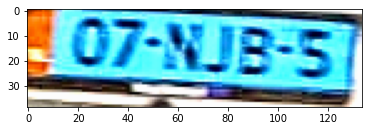

Plates found: ['SE', 'GC', 'VE', 'EC', 'VL', '1', 'DC', '8L68GQ86X']
07-NJB-5
Max accuracy: 0.0
Speed: 4.214

./Dataset/TesseractEvaluation/evaluation/model_3/004.png


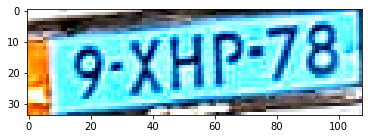

Plates found: ['ZZ', 'C588', 'EZ 588', 'ZF', '5Z58BE', '5X8', 'ZL', 'ZEB']
17-HK-LG
Max accuracy: 0.25
Speed: 3.818

./Dataset/TesseractEvaluation/evaluation/model_3/005.png


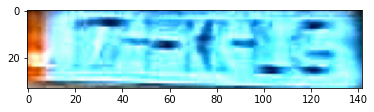

Plates found: ['8', 'LGW 9A', 'ZW 9 A2', 'ZW ZA', '4', 'LEW 9 AZ', 'AW 9 AS', 'ZW A GCS']
9-XHP-78
Max accuracy: 0.2857142857142857
Speed: 3.987

./Dataset/TesseractEvaluation/evaluation/model_3/006.png


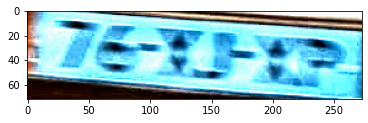

Plates found: ['LZ CX', 'ZX', 'L682OPZ', 'L6ZCOPR', 'U ZWD', 'BZ', 'LBZ CX', 'L680 OPE', 'LZ WD']
76-XJ-XP
Max accuracy: 0.3076923076923077
Speed: 5.709

./Dataset/TesseractEvaluation/evaluation/model_3/007.png


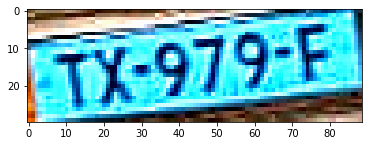

Plates found: ['ZZ', 'KZ', 'PG GZ', 'XG', 'LE', 'FBG GZ', 'LZ', 'PD']
TX-979-F
Max accuracy: 0.25
Speed: 3.661

./Dataset/TesseractEvaluation/evaluation/model_3/008.png


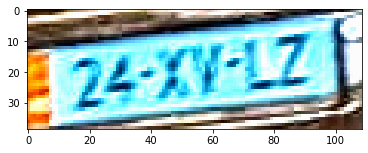

Plates found: ['EZ', '', 'ZU', 'LU', 'GZ', 'BZ']
24-XV-LZ
Max accuracy: 0.25
Speed: 3.99

./Dataset/TesseractEvaluation/evaluation/model_3/009.png


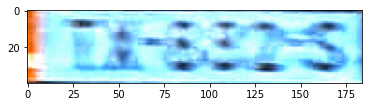

Plates found: ['SZ', 'FZ', 'GZ', 'JG ZS', 'JZ SAQA', '4LL LL 12 L', 'JZ6 ZAZA', 'JT 6 S6ZSA', 'J7 6 S6ZAS', 'JESS ZS']
TX-882-S
Max accuracy: 0.2857142857142857
Speed: 4.415

./Dataset/TesseractEvaluation/evaluation/model_3/010.png


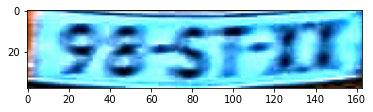

Plates found: ['EBS', 'LZ8A7Z', 'JEEZ', 'JE', 'L28S20W', 'L6Z8S5RX', 'EAS PZ', 'LE8A7XW', 'LE8S2R4X', 'L2SA2ZE6']
98-ST-XX
Max accuracy: 0.42857142857142855
Speed: 4.348

./Dataset/TesseractEvaluation/evaluation/model_3/015.png


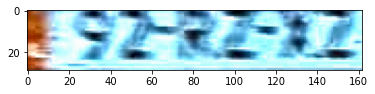

Plates found: ['E1ZZSZ AZZ', 'ETSZTBZSZ', 'JAS ZZ', 'ETZZTAZCZZ', ' BEESLZSAZ', 'ETSZTAG0TZZ', 'ETSZAZZZZ', 'ET2ZG0T8Z', 'ET2ZA ZT8Z', 'E1ZZSGAZCZZ']
92-RZ-XZ
Max accuracy: 0.4
Speed: 4.12

./Dataset/TesseractEvaluation/evaluation/model_3/016.png


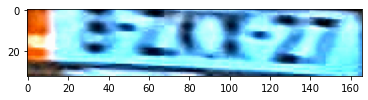

Plates found: ['LZ ZZ ZY', 'AZ WZ SZ ZZ', 'LB V2', 'LZZZFZYT', 'ELA ZZ DXGY', 'AWS SZ', 'SZ E2ZY', 'LZ ZZEZYT', 'LAZZPZYVT', 'LZ ZY']
8-ZKX-27
Max accuracy: 0.3333333333333333
Speed: 4.041

./Dataset/TesseractEvaluation/evaluation/model_3/017.png


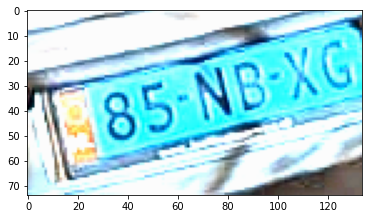

Plates found: ['SU', 'QS', 'DZ', 'ZL', 'A', 'DL']
85-NB-XG
Max accuracy: 0.0
Speed: 5.1

./Dataset/TesseractEvaluation/evaluation/model_3/018.png


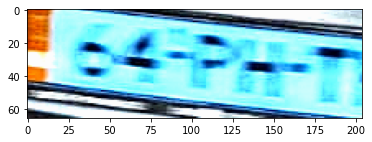

Plates found: ['WV', 'ZV', '4SSZ1C', 'EV', 'EQ SCC', '4SSZIC', '4SSCC', 'Q8CC']
64-PH-T
Max accuracy: 0.2
Speed: 4.767

./Dataset/TesseractEvaluation/evaluation/model_3/019.png


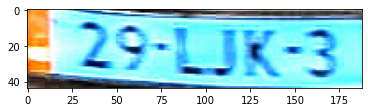

Plates found: ['L26LET0TS', 'L6ESZH8B7S', 'L6SLEH87S', 'L6ESZJ87S', 'L68ZLE4S7S', 'L6EZZB7S', 'L6SZ387S', 'EL8Z MBX', 'L62LEH8TS', 'L6SZJ87S']
29-LJK-3
Max accuracy: 0.2857142857142857
Speed: 4.471

./Dataset/TesseractEvaluation/evaluation/model_3/020.png


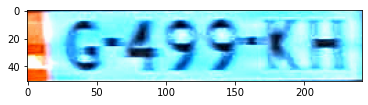

Plates found: ['88 A22 ZT', '88AS6Z BH', '8S A2S BT', '88 A296 ST', '88S A622 AT', '88466 BH', '818 S22 S11', '5S ASS BH', '88 A22 AT', '8S ASS BH']
G-499-KH
Max accuracy: 0.3076923076923077
Speed: 5.25

./Dataset/TesseractEvaluation/evaluation/model_3/021.png


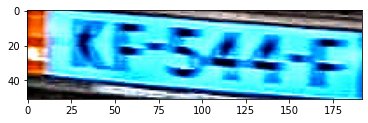

Plates found: ['ZZ', 'ZU', 'EB', 'ZC', 'ZS', 'BZ', 'ED', 'LE KX']
KF-544-F
Max accuracy: 0.2
Speed: 4.656

./Dataset/TesseractEvaluation/evaluation/model_3/023.png


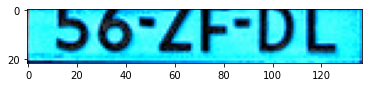

Plates found: ['1002AFYUL 1', '1A02AFYKL 1', '1G02ATFYKL 1', '1GA0C2AFYKL 1', '1002ZCFYU 1', 'LE0C0CPYLPL 1', '1002ACFYUL 1', 'LE00CPEYPT', '100ZZCFYK 1', 'J1002AFYKL 1']
56-ZF-DL
Max accuracy: 0.25
Speed: 3.748

./Dataset/TesseractEvaluation/evaluation/model_3/024.png


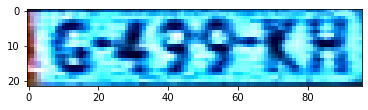

Plates found: ['JE', 'BQ SZ SZ SE', 'JB', 'J8EA660R', 'ED', 'JBEA66B0R', 'JEAMGR', 'IEA', 'BAS']
G-499-KH
Max accuracy: 0.16666666666666666
Speed: 3.661

./Dataset/TesseractEvaluation/evaluation/model_3/025.png


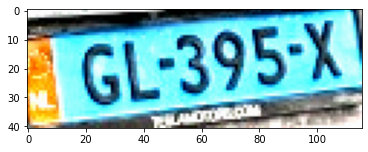

Plates found: ['', 'DZ', 'GZ', 'LZ']
GL-395-X
Max accuracy: 0.25
Speed: 4.061

./Dataset/TesseractEvaluation/evaluation/model_3/026.png


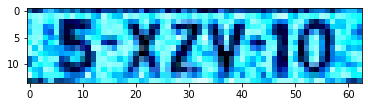

Plates found: ['81S 5SE', 'A2888RB', 'X58BES88BS', 'A288S60R8B4', 'A28B6255B', 'XGES88G', 'I828B6S58BI', 'GQ AG8888BG', 'A588S888', 'RQX8888G']
5-XZY-10
Max accuracy: 0.16666666666666666
Speed: 3.372

./Dataset/TesseractEvaluation/evaluation/model_3/027.png


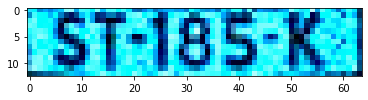

Plates found: ['L82238STRK1', 'L83P58S2B2', '6368SS2', '6498882', '632S8B8B2BQG', '6320G8B8F8B5', 'L83658SS2', '632G8B82QG', 'L82X8STR2', 'L832P5882RK2']
ST-185-K
Max accuracy: 0.35294117647058826
Speed: 3.361

./Dataset/TesseractEvaluation/evaluation/model_3/028.png


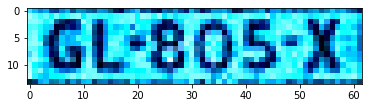

Plates found: ['Z0E888X', 'Z0E8882S', 'E088', 'EE8BZ', '8ED888BZ', 'BEEBE', 'BEKDB8B82Z', 'EEE', '8ED888X', 'BEE']
GL-805-X
Max accuracy: 0.3076923076923077
Speed: 3.436

./Dataset/TesseractEvaluation/evaluation/model_3/029.png


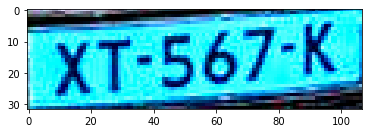

Plates found: ['848886', '82L86ZS', 'W888', 'C880', '82L8SE6', 'W880', 'M6888', 'T82L8SZS', '8880', '9880S']
XT-567-K
Max accuracy: 0.18181818181818182
Speed: 3.937

./Dataset/TesseractEvaluation/evaluation/model_3/030.png


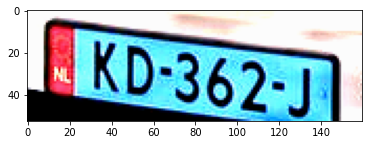

Plates found: ['EZ J5T', 'J']
KD-362-J
Max accuracy: 0.2857142857142857
Speed: 4.397

./Dataset/TesseractEvaluation/evaluation/model_3/031.png


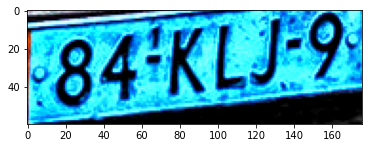

Plates found: ['8S8G', '1', 'DZ', '8S', '8S8EG', '8SS8G', '8S8E08']
84-KLJ-9
Max accuracy: 0.25
Speed: 5.167

./Dataset/TesseractEvaluation/evaluation/model_3/032.png


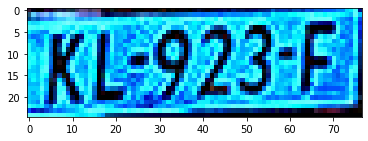

Plates found: ['8RQ8SS', 'LD', '8B ESS', '1', 'DZ', 'DL', '5KQ8SS', '5RQ88S']
KL-923-F
Max accuracy: 0.25
Speed: 3.631

./Dataset/TesseractEvaluation/evaluation/model_3/033.png


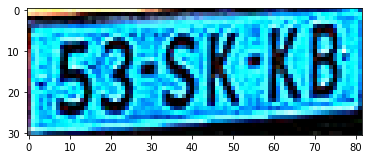

Plates found: ['BD', 'DD', '8888', '8S88B0', '1', '8B', '888', 'DL']
53-SK-KB
Max accuracy: 0.3333333333333333
Speed: 3.704

./Dataset/TesseractEvaluation/evaluation/model_3/034.png


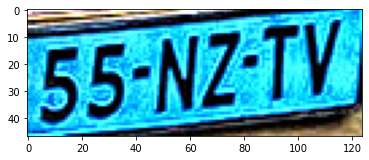

Plates found: ['', 'S88', '88S', 'LD', 'SED', 'DE', 'LZ', 'GD', 'SSE']
55-NZ-TV
Max accuracy: 0.25
Speed: 4.657

./Dataset/TesseractEvaluation/evaluation/model_3/035.png


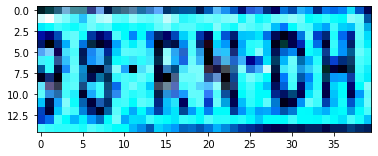

Plates found: ['5B', 'JE', '5S', '528A', '1', 'ED', 'J52AEE']
98-RN-DH
Max accuracy: 0.25
Speed: 3.548

./Dataset/TesseractEvaluation/evaluation/model_3/036.png


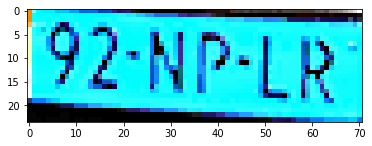

Plates found: ['2518R18', '6Z8EE8', '6E8EI58', 'S888', '8E8EI8', 'G8E28', '88EI8', 'SZ8828', 'SZ88E8']
92-NP-LR
Max accuracy: 0.3076923076923077
Speed: 3.6

./Dataset/TesseractEvaluation/evaluation/model_3/037.png


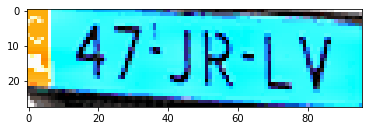

Plates found: ['3238S', '3281S', '6389', '323869', 'LS638JL9', '6089']
47-JR-LV
Max accuracy: 0.2857142857142857
Speed: 3.676

./Dataset/TesseractEvaluation/evaluation/model_3/038.png


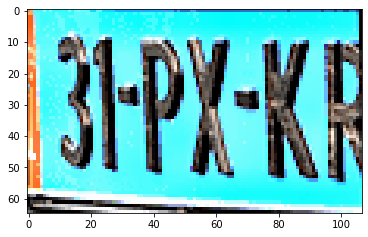

Plates found: ['89', '886', '856', '82', '852', '855']
31-PX-KR
Max accuracy: 0.0
Speed: 4.457

./Dataset/TesseractEvaluation/evaluation/model_3/039.png


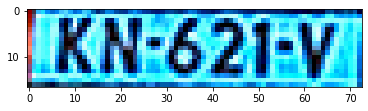

Plates found: ['BCS8PZ', 'ZZ', 'AE', 'AB RE', 'JBBS8PZ', 'BBG8BRE', 'BBX8BR8E', 'BBSSZ08', 'EK']
KN-621-V
Max accuracy: 0.25
Speed: 3.541

./Dataset/TesseractEvaluation/evaluation/model_3/040.png


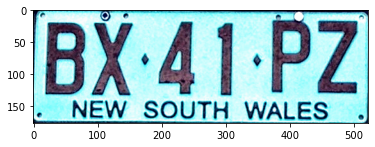

Plates found: ['B8 4ILB8', 'B8 4 I B8', '88SILB', '88SIL8E', '88SI BE']
BX-41-PZ
Max accuracy: 0.3333333333333333
Speed: 13.832

./Dataset/TesseractEvaluation/evaluation/model_3/042.png


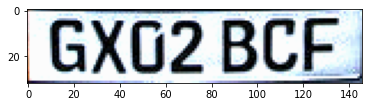

Plates found: ['1BR0BEB0E', '1BR0BEBDE', '1BR0EBDE', '1BR08BBDEL', '1BR0BEB0EL']
GX02 BCF
Max accuracy: 0.26666666666666666
Speed: 4.169

./Dataset/TesseractEvaluation/evaluation/model_3/043.png


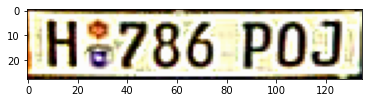

Plates found: ['68E8R1BB', 'JRK5EZ881RR4', 'P56Z881RBS', 'Z8E8RB1BB', 'J08E881BR', 'J0569881RB8', 'PEZ881RBS', 'JR5EZ8S1RRB4', 'JRK5Z8S1RRB49', 'Z8E881BB']
H 786 POJ
Max accuracy: 0.13333333333333333
Speed: 3.973

Average time: 4.418216216216217
Average accuracy: 0.245207336383807


In [81]:
Tesseract_Complete_Evaluation(r"model_3/", lang="plate_model_4")